# CPSC 8810 Final Project: Deep Learning for Computational Photography

Mohammad Alshurbaji, #19803342 

## Setup Code
Before getting started, we need to run some boilerplate code to set up our environment. You'll need to rerun this setup code each time you start the notebook.

First, run this cell load the autoreload extension. This allows us to edit .py source files, and re-import them into the notebook for a seamless editing and debugging experience.

In [1]:
%load_ext autoreload
%autoreload 2

### Google Colab Setup
Next we need to run a few commands to set up our environment on Google Colab. If you are running this notebook on a local machine you can skip this section.

Run the following cell to mount your Google Drive. Follow the link, sign in to your Google account (the same account you used to store this notebook!) and copy the authorization code into the text box that appears below.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Data preprocessing

## Setup code
Import some useful packages and increase the default figure size.

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import time

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

We will use GPUs to accelerate our computation in this notebook. Run the following to make sure GPUs are enabled:

In [3]:
if torch.cuda.is_available():
    print('Good to go!')
else:
    print('Please set GPU via Edit -> Notebook Settings.')

Good to go!


# Load the dataset

Note: You need to create a dataloader to load the training and testing images. You may need to modify the data loader based on your own project's data types.

Please save your training data in a folder named "train", and testing/validation data in folder "val"

In [4]:
import os
import numpy as np
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to 224x224
        transforms.RandomHorizontalFlip(),  # Data augmentation
        transforms.ToTensor(),  # Convert to tensor
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
}
class PairedDepthDataset(Dataset):
    # def __init__(self, root_dir, transform=None, depth_ext=".png", is_train=True):
    def __init__(self, root_dir, transform=None, max_samples = None):
        """
        Args:
            root_dir (string): Directory containing paired RGB and depth images.
            transform (callable, optional): Optional transform to apply to the images.
            depth_ext (string): File extension for depth maps (default: ".jpg").
            is_train (bool): Whether the dataset is for training or validation.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.rgb_files = []
        for folder in os.listdir(root_dir):
            folder_path = os.path.join(root_dir, folder)
            if os.path.isdir(folder_path):
                self.rgb_files.extend(
                    [os.path.join(folder, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]
                )
        #     else:
        # # Collect RGB files from the validation folder
        #         self.rgb_files = sorted([f for f in os.listdir(root_dir) if f.endswith('colors.png')])
        if max_samples:
            self.rgb_files = self.rgb_files[:max_samples]

        print(f"Loaded {len(self.rgb_files)} samples from {root_dir}")

    def __len__(self):
        return len(self.rgb_files)

    def __getitem__(self, idx):
        # Get the file paths for the RGB and depth images
        rgb_rel_path = self.rgb_files[idx]
        rgb_path = os.path.join(self.root_dir, rgb_rel_path)
        # depth_path = rgb_path.replace('colors.png', self.depth_ext)
        depth_path = rgb_path.replace('.jpg', '.png')

        # Load RGB and depth images
        rgb_image = Image.open(rgb_path).convert('RGB')
        depth_image = Image.open(depth_path).convert('L')
        
        if self.transform:
            rgb_image = self.transform(rgb_image)  # Transform the RGB image
            # depth_image = transforms.ToTensor()(depth_image)  # Convert depth map to tensor
            depth_image = transforms.Compose([
            transforms.Resize((224, 224)),  # Match RGB size
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize depth map
        ])(depth_image)

        return rgb_image, depth_image

    
# Dataset directory
data_dir = 'nyu_data/data'  # Root dataset directory
image_datasets = {
    'train': PairedDepthDataset(os.path.join(data_dir, 'train'), transform=data_transforms['train'], max_samples = 1000),
    'val': PairedDepthDataset(os.path.join(data_dir, 'val'), transform=data_transforms['val'], max_samples = 100),
}
# image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
print(f"Number of training samples: {len(image_datasets['train'])}")
print(f"Number of validation samples: {len(image_datasets['val'])}")

Loaded 1000 samples from nyu_data/data/train
Loaded 100 samples from nyu_data/data/val
Number of training samples: 1000
Number of validation samples: 100


## Load the data
Note: This section loads the dataset from the specified directory. Replace 'path/to/dataset' with the actual path to your dataset. The ImageFolder class from torchvision is used to load the images and their corresponding labels.


This section creates data loaders for training and validation sets. The batch_size parameter determines the number of samples in each batch. The shuffle=True parameter ensures that the data is shuffled during training.


In [5]:
# Create data loaders
batch_size = 32
dataloaders = {x: DataLoader(image_datasets[x], batch_size=batch_size, shuffle=True) for x in ['train', 'val']}

## Visualize the loaded training and testing image pairs
Note: Print out a row a traing/validation data. Print out the input and output of the network:
- For Depth from 2D, please print out the input image and its corresponding depth map
- For PointCloud from 2D, please print out the input image and its corresponding point cloud. You may need to install PyTorch 3D for visualizing the point clould
- For NeRF, please print out the first batch input image of both Training and Testing

Training Data:


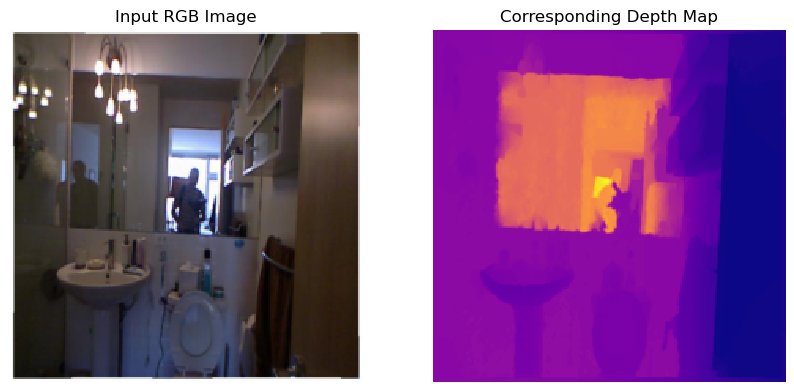

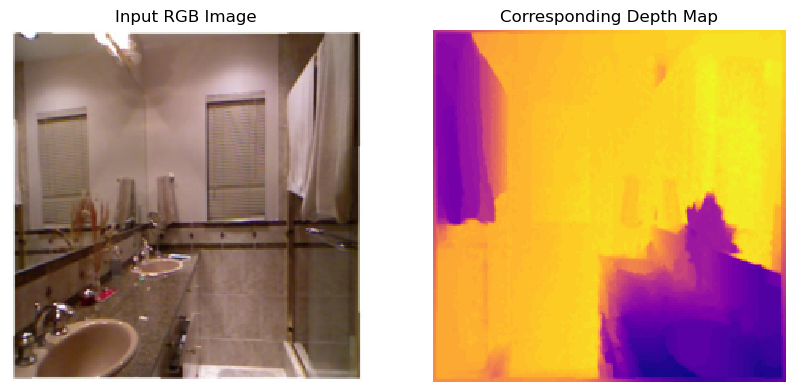

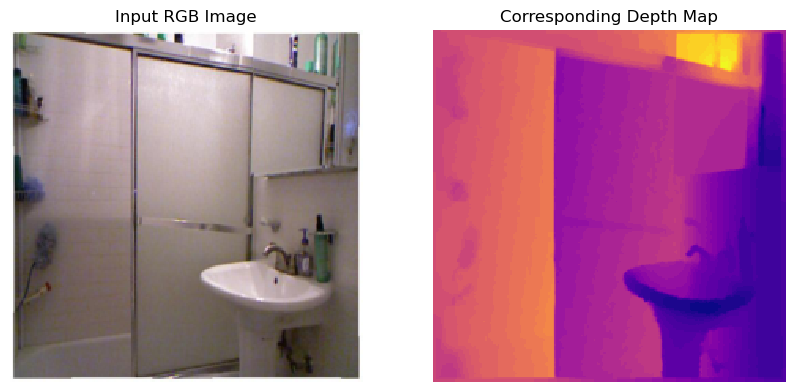


Validation Data:


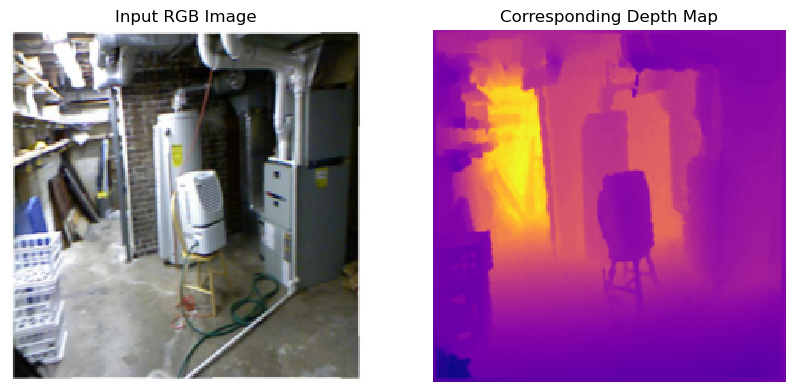

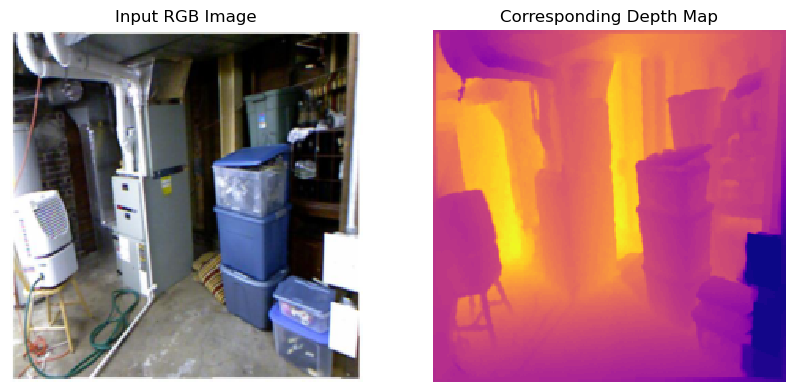

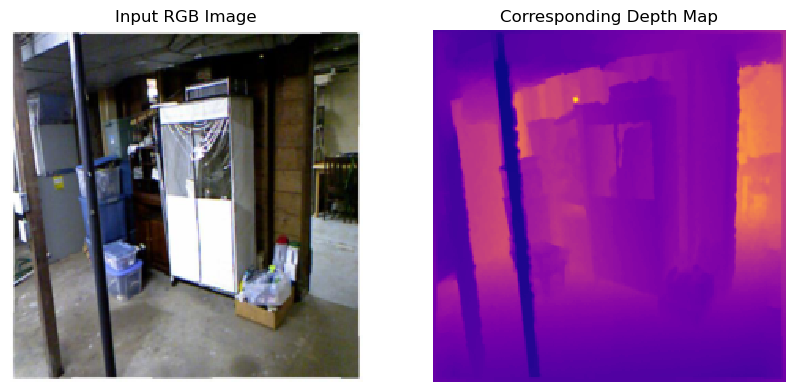

In [6]:
# Define your visulaization algorithm.
import matplotlib.pyplot as plt
def visualize_data(data_loader, num_images=1):
    for images, depths in data_loader:
        
        valid_count = 0  # Count of valid samples visualized
        # Visualize the specified number of samples
        for i in range(min(num_images, len(images))):
            if images[i].sum() == 0 or depths[i].sum() == 0:
                continue
            # Input RGB Image
            plt.subplot(1, 2, 1)
            plt.imshow(images[i].permute(1, 2, 0).numpy() * 0.5 + 0.5)  # Unnormalize
            plt.title("Input RGB Image")
            plt.axis("off")

            # Corresponding Depth Map
            plt.subplot(1, 2, 2)
            plt.imshow(depths[i].squeeze(0).numpy(), cmap='plasma')  # Depth map
            plt.title("Corresponding Depth Map")
            plt.axis("off")

            plt.show()
            
            valid_count += 1
            if valid_count >= num_images:
                break
        
        # Break after visualizing the required number of samples
        break
   

# Print out a row of training/validation data and corresponding output images
print("Training Data:")  
visualize_data(dataloaders['train'], num_images=3)

print("\nValidation Data:")
visualize_data(dataloaders['val'], num_images=3)

# Define the Deep Learning model
Note: In this section, you need to define your own Deep Learning models for prediction

In [7]:
# Define the CNN mode
import torch
import torch.nn as nn
import torch.nn.functional as F

class Real3DPredictionNN(nn.Module):
    def __init__(self):
        super(Real3DPredictionNN, self).__init__()
        # Encoder: Convolution + Batch Norm + Dropout
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.05),
            nn.Dropout(0.2)
        )
        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.05),
            nn.Dropout(0.2)
        )
        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.05),
            nn.Dropout(0.2)
        )
        self.enc4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.05),
            nn.Dropout(0.2)
        )

        # Decoder: Transpose Convolution + Batch Norm
        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.05)
        )
        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.05)
        )
        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.05)
        )
        self.dec1 = nn.ConvTranspose2d(64, 1, kernel_size=5, stride=2, padding=2, output_padding=1)

        # Skip connections
        self.skip1 = nn.Conv2d(64, 64, kernel_size=1)
        self.skip2 = nn.Conv2d(128, 128, kernel_size=1)
        self.skip3 = nn.Conv2d(256, 256, kernel_size=1)

    def forward(self, x):
        # Encoder
        x1 = self.enc1(x)
        x2 = self.enc2(x1)
        x3 = self.enc3(x2)
        x4 = self.enc4(x3)

        # Decoder with skip connections
        x = self.dec4(x4) + self.skip3(x3)
        x = self.dec3(x) + self.skip2(x2)
        x = self.dec2(x) + self.skip1(x1)
        x = self.dec1(x)

        prediction_image = torch.tanh(x)

        return prediction_image


## Model Initialization
Note: This section initializes the model, loss function , and optimizer.

In [8]:
model = Real3DPredictionNN()
optimizer = optim.Adam(model.parameters(), lr=0.001)

## Loss Functions
Note: Please define the training loss

In [9]:
import torch
# import torch.nn.functional as F

# Define the Reconstruction Loss
def Recons_loss(outputs, labels):
    # Mean Absolute Error (MAE)
    mae_loss = torch.mean(torch.abs(outputs - labels))
    
    # Root Mean Square Error (RMSE)
    rmse_loss = torch.sqrt(torch.mean((outputs - labels) ** 2))
    
    # Combine losses 
    loss_val = mae_loss + rmse_loss
    
    return loss_val


In [10]:
# for inputs, labels in dataloaders['train']:
#     print(inputs.shape, inputs.dtype)
#     print(labels.shape, labels.dtype)
print(type(dataloaders['train'].dataset))


<class '__main__.PairedDepthDataset'>


## Training Loop
Note: This section contains the training loop. It iterates over the specified number of epochs and trains the model on the training set. During the validation phase, it evaluates the model on the validation set without performing backpropagation and optimization. The loss for each epoch is calculated and printed.

In [11]:
# Training loop
# num_epochs = 10 ########### Please change it to larger number ########## 
import matplotlib.pyplot as plt

# Training loop
num_epochs = 100
train_losses = []
val_losses = []

# Start the timer
start_time = time.time()

for epoch in range(num_epochs):
    # Training phase
    model.train()  # Set the model to training mode
    running_train_loss = 0.0
    for inputs, labels in dataloaders['train']:
        # Forward pass
        outputs = model(inputs)
        loss = Recons_loss(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Calculate the running loss
        running_train_loss += loss.item() * inputs.size(0)

    epoch_train_loss = running_train_loss / len(dataloaders['train'].dataset)
    train_losses.append(epoch_train_loss)

    # Validation phase
    model.eval()   # Set the model to evaluation mode
    running_val_loss = 0.0
    for inputs, labels in dataloaders['val']:
        # Forward passs
        # outputs = Recons_loss(inputs)
        # loss = criterion(outputs, labels)
        outputs = model(inputs)  # Correct: Pass inputs through the model
        loss = Recons_loss(outputs, labels)  

        # Calculate the running loss
        running_val_loss += loss.item() * inputs.size(0)

    epoch_val_loss = running_val_loss / len(dataloaders['val'].dataset)
    val_losses.append(epoch_val_loss)

    # Print the loss for every 100 epochs
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}')
# End the timer
end_time = time.time()
total_time = end_time - start_time
print(f'Total training time: {total_time:.2f} seconds')

# Save the trained model
torch.save(model.state_dict(), 'Your_prediction_model.pth')

Epoch 10/100, Train Loss: 0.2208, Val Loss: 0.5377
Epoch 20/100, Train Loss: 0.1982, Val Loss: 0.5088
Epoch 30/100, Train Loss: 0.1864, Val Loss: 0.5182
Epoch 40/100, Train Loss: 0.1745, Val Loss: 0.4758
Epoch 50/100, Train Loss: 0.1632, Val Loss: 0.4595
Epoch 60/100, Train Loss: 0.1470, Val Loss: 0.4683
Epoch 70/100, Train Loss: 0.1417, Val Loss: 0.4944
Epoch 80/100, Train Loss: 0.1318, Val Loss: 0.4775
Epoch 90/100, Train Loss: 0.1247, Val Loss: 0.4947
Epoch 100/100, Train Loss: 0.1203, Val Loss: 0.5063
Total training time: 21567.91 seconds


In [12]:
#Continuing Training
# Load the model and optimizer states
model.load_state_dict(torch.load('Your_prediction_model.pth' , weights_only=True))
# optimizer.load_state_dict(torch.load('Your_optimizer_state.pth'))

<All keys matched successfully>

In [15]:
# Increase the number of epochs
num_epochs = 100
additional_epochs = 50  # Train for more epochs
train_losses = []
val_losses = []

# Continue training from the last epoch
for epoch in range(num_epochs, num_epochs + additional_epochs):
    # Training phase
    model.train()
    running_train_loss = 0.0

    for inputs, labels in dataloaders['train']:
        outputs = model(inputs)
        loss = Recons_loss(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item() * inputs.size(0)

    epoch_train_loss = running_train_loss / len(dataloaders['train'].dataset)
    train_losses.append(epoch_train_loss)

    # Validation phase
    model.eval()
    running_val_loss = 0.0

    with torch.no_grad():
        for inputs, labels in dataloaders['val']:
            outputs = model(inputs)
            loss = Recons_loss(outputs, labels)
            running_val_loss += loss.item() * inputs.size(0)

    epoch_val_loss = running_val_loss / len(dataloaders['val'].dataset)
    val_losses.append(epoch_val_loss)

    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs + additional_epochs}, '
              f'Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}')

# Update the total epochs count
num_epochs += additional_epochs

# Save the updated model and optimizer states
torch.save(model.state_dict(), 'Your_prediction_model.pth')
# torch.save(optimizer.state_dict(), 'Your_optimizer_state.pth')


Epoch 110/150, Train Loss: 0.1155, Val Loss: 0.5015
Epoch 120/150, Train Loss: 0.1091, Val Loss: 0.5087
Epoch 130/150, Train Loss: 0.1041, Val Loss: 0.5044
Epoch 140/150, Train Loss: 0.1011, Val Loss: 0.5078
Epoch 150/150, Train Loss: 0.0973, Val Loss: 0.4806


In [11]:
#Continuing Training
# Load the model and optimizer states
model.load_state_dict(torch.load('Your_prediction_model.pth' , weights_only=True))
# optimizer.load_state_dict(torch.load('Your_optimizer_state.pth'))

<All keys matched successfully>

In [12]:
# Increase the number of epochs
num_epochs = 150
additional_epochs = 200  # Train for more epochs
train_losses = []
val_losses = []

# Continue training from the last epoch
for epoch in range(num_epochs, num_epochs + additional_epochs):
    # Training phase
    model.train()
    running_train_loss = 0.0

    for inputs, labels in dataloaders['train']:
        outputs = model(inputs)
        loss = Recons_loss(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item() * inputs.size(0)

    epoch_train_loss = running_train_loss / len(dataloaders['train'].dataset)
    train_losses.append(epoch_train_loss)

    # Validation phase
    model.eval()
    running_val_loss = 0.0

    with torch.no_grad():
        for inputs, labels in dataloaders['val']:
            outputs = model(inputs)
            loss = Recons_loss(outputs, labels)
            running_val_loss += loss.item() * inputs.size(0)

    epoch_val_loss = running_val_loss / len(dataloaders['val'].dataset)
    val_losses.append(epoch_val_loss)

    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f'Epoch {epoch + 1}/{num_epochs + additional_epochs}, '
              f'Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}')

# Update the total epochs count
num_epochs += additional_epochs

# Save the updated model and optimizer states
torch.save(model.state_dict(), 'Your_prediction_model.pth')
# torch.save(optimizer.state_dict(), 'Your_optimizer_state.pth')


Epoch 160/350, Train Loss: 0.0950, Val Loss: 0.4897
Epoch 170/350, Train Loss: 0.0914, Val Loss: 0.4873
Epoch 180/350, Train Loss: 0.0881, Val Loss: 0.4843
Epoch 190/350, Train Loss: 0.0851, Val Loss: 0.5105
Epoch 200/350, Train Loss: 0.0822, Val Loss: 0.5093
Epoch 210/350, Train Loss: 0.0834, Val Loss: 0.4893
Epoch 220/350, Train Loss: 0.0833, Val Loss: 0.4599
Epoch 230/350, Train Loss: 0.0774, Val Loss: 0.4866
Epoch 240/350, Train Loss: 0.0772, Val Loss: 0.4830
Epoch 250/350, Train Loss: 0.0741, Val Loss: 0.4768
Epoch 260/350, Train Loss: 0.0738, Val Loss: 0.5157
Epoch 270/350, Train Loss: 0.0732, Val Loss: 0.5072
Epoch 280/350, Train Loss: 0.0706, Val Loss: 0.4990
Epoch 290/350, Train Loss: 0.0696, Val Loss: 0.5017
Epoch 300/350, Train Loss: 0.0692, Val Loss: 0.4932
Epoch 310/350, Train Loss: 0.0702, Val Loss: 0.4983
Epoch 320/350, Train Loss: 0.0677, Val Loss: 0.4883
Epoch 330/350, Train Loss: 0.0663, Val Loss: 0.5079
Epoch 340/350, Train Loss: 0.0656, Val Loss: 0.4953
Epoch 350/35

## Visualize the Training Curve and Validation Results
Note: In this section, you need to visualize the Training curve in the training loop and print out the first 10 validation data in the order of: input image- prediction - groundtruth 

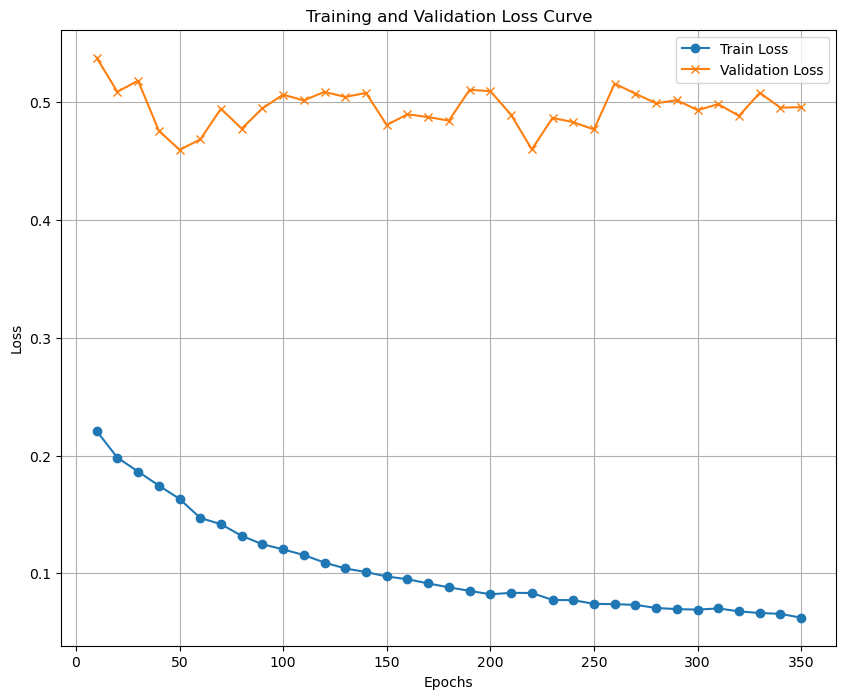

Sample 1: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 2: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 3: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 4: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 5: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 6: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 7: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 8: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 9: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 10: Predicted Depth Range: (0.0000, 1.0000), Ground Truth Depth Range: (0.0000, 1.0000)
Sample 11: Predicted Depth Range: (0.0000, 1.0000), Ground 

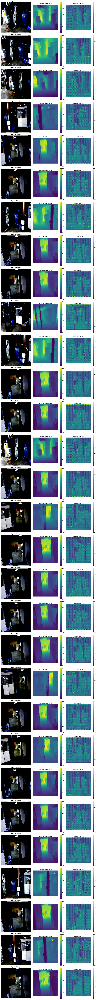

In [14]:
#Final Visualization after continuing Training
epochs = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350]
train_losses = [0.2208, 0.1982, 0.1864, 0.1745, 0.1632, 0.1470, 0.1417, 0.1318, 0.1247, 0.1203, 0.1155, 0.1091, 0.1041, 0.1011, 0.0973, 0.0950, 0.0914, 0.0881, 0.0851, 0.0822, 0.0834, 0.0833, 0.0774, 0.0772, 0.0741, 0.0738, 0.0732, 0.0706, 0.0696, 0.0692, 0.0702, 0.0677, 0.0663, 0.0656, 0.0623]
val_losses = [0.5377, 0.5088, 0.5182, 0.4758, 0.4595, 0.4683, 0.4944, 0.4775, 0.4947, 0.5063, 0.5015, 0.5087, 0.5044, 0.5078, 0.4806, 0.4897, 0.4873, 0.4843, 0.5105, 0.5093, 0.4893, 0.4599, 0.4866, 0.4830, 0.4768, 0.5157, 0.5072, 0.4990, 0.5017, 0.4932, 0.4983, 0.4883, 0.5079, 0.4953, 0.4957]

# Plot the training and validation loss curves
plt.plot(epochs, train_losses, label="Train Loss", marker='o')
plt.plot(epochs, val_losses, label="Validation Loss", marker='x')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Curve')
plt.legend()
plt.grid(True)
plt.show()


# Model evaluation and visualization
model.eval()

# Visualization settings
num_samples_to_show = 30  # Number of validation samples to visualize
fig, axes = plt.subplots(num_samples_to_show, 3, figsize=(15, 5 * num_samples_to_show))

# Ensure axes are handled correctly even for single-row visualizations
if num_samples_to_show == 1:
    axes = [axes]

with torch.no_grad():  # No gradients needed
    sample_count = 0  # Track how many samples have been plotted
    for inputs, labels in dataloaders['val']:
        for batch_idx in range(inputs.size(0)):  # Loop over the batch
            if sample_count >= num_samples_to_show:
                break

            # Extract input image and ground truth depth map
            input_image = TF.to_pil_image(inputs[batch_idx].clamp(0, 1))  # Clamp to valid range [0, 1]
            ground_truth_depth = labels[batch_idx, 0].cpu().numpy()  # Extract depth map

            # Get model predictions
            predictions = model(inputs)  # Perform inference
            predicted_depth = predictions[batch_idx, 0].cpu().detach().numpy()  # Extract depth map

            # Normalize depth maps for visualization
            predicted_depth = (predicted_depth - predicted_depth.min()) / (predicted_depth.max() - predicted_depth.min() + 1e-8)
            ground_truth_depth = (ground_truth_depth - ground_truth_depth.min()) / (ground_truth_depth.max() - ground_truth_depth.min() + 1e-8)

            # Print one-line summary for each sample
            print(f"Sample {sample_count + 1}: Predicted Depth Range: ({predicted_depth.min():.4f}, {predicted_depth.max():.4f}), Ground Truth Depth Range: ({ground_truth_depth.min():.4f}, {ground_truth_depth.max():.4f})")

            # Plot Input Image
            axes[sample_count][0].imshow(input_image)
            axes[sample_count][0].set_title("Input RGB Image")
            axes[sample_count][0].axis("off")

            # Plot Ground Truth Depth Map
            im1 = axes[sample_count][1].imshow(ground_truth_depth, cmap="viridis")
            axes[sample_count][1].set_title("Ground Truth Depth Map")
            axes[sample_count][1].axis("off")
            fig.colorbar(im1, ax=axes[sample_count][1])

            # Plot Predicted Depth Map
            im2 = axes[sample_count][2].imshow(predicted_depth, cmap="viridis")
            axes[sample_count][2].set_title("Predicted Depth Map")
            axes[sample_count][2].axis("off")
            fig.colorbar(im2, ax=axes[sample_count][2])

            # Increment the sample count
            sample_count += 1

        if sample_count >= num_samples_to_show:
            break

plt.tight_layout()
plt.show()


# Future Work
As this project is getting better and better after so many models. This last enhanced model shows a satisfactory results but need to increase the data samples to secure more accuracy and less losses. 